In [1]:
import numpy as np
import pandas as pd
import seaborn as sns
import tqdm
import umap
import xarray as xr
import matplotlib.pyplot as plt
from mpl_toolkits.mplot3d import Axes3D
import holoviews as hv
from holoviews import dim, opts
from bokeh.models import HoverTool
from sklearn.cluster import KMeans
from sklearn import preprocessing

from sklearn.metrics import confusion_matrix
import itertools
le = preprocessing.LabelEncoder()

In [27]:
# font size for plots
plt.rcParams.update({'font.size': 17})

In [2]:
def rolling_window_varslide(a, window, slide):
    shape = a.shape[:-1] + (a.shape[-1] - window + 1, window)
    strides = np.array(a.strides + (a.strides[-1],))
    return np.lib.stride_tricks.as_strided(a, shape=shape, strides=strides, writeable=False)[0:shape[0]:slide]

def interpolate_nan_max_gap_series(s, maxgap):        
    df = pd.DataFrame(s)
    
    # Calculate NaN gap width
    df['nan_gap_width'] = (s
                           .isnull()
                           .cumsum()
                           .loc[~s.isnull()]
                           .diff()
                          )
    df['nan_gap_width'] = df['nan_gap_width'].fillna(method='bfill')
                          
    # Interpolate all NaNs but fill back in those in the
    # gaps that are longer than the allowed limite
    nan_ix = s.isnull()
    s = s.interpolate()
    s[(df['nan_gap_width'] > maxgap) & nan_ix] = pd.np.nan
        
    return s

def interpolate_nan_max_gap_frame(df, maxgap):
    for column_name in df:
        df[column_name] = interpolate_nan_max_gap_series(df[column_name], maxgap=maxgap)
    return df

def sample_interp(a, window, maxgap):
    b = a.copy()
    b = interpolate_nan_max_gap_series(pd.Series(b), maxgap).values
    b = rolling_window_varslide(b, window, window)
    return b

def gen_dataset(ds, window, maxgap):
    
    samples_train = []
    ref_train = []
    meta_train = []
    auto_train = []
    for k in tqdm.tqdm(range(39)):
        battv = sample_interp(ds.battv[:, k].copy(), window, maxgap)
        for i in range(6):
            ds_subset = ds.sel(dict(box=ds.box[k], level=ds.level[i])).copy()
#             ds_subset = ds_subset.where(ds_subset.moisture_flag!='Auto:BattV')
#             ds_subset = ds_subset.where(ds_subset.moisture_flag!='Auto:Range')
#             ds_subset = ds_subset.where(ds_subset.moisture_flag!='Auto:Spike')
#             ds_subset = ds_subset.where(ds_subset.temp_flag!='Auto:BattV')
#             ds_subset = ds_subset.where(ds_subset.temp_flag!='Auto:Range')
#             ds_subset = ds_subset.where(ds_subset.temp_flag!='Auto:Spike')
            moisture = sample_interp(ds_subset['moisture'][:].copy(), window, maxgap)
            temperature = sample_interp(ds_subset['temp'][:].copy(), window, maxgap)
            flag = sample_interp(ds_subset['class'][:].copy(), window, maxgap)
            flag = np.sum(flag, axis=-1)>0
            auto = sample_interp(ds_subset['auto'][:].copy(), window, maxgap)
            auto = np.sum(auto, axis=-1)>0
            samp = np.stack((moisture, temperature, battv), axis=-1)
            samples_train.append(samp)
            ref_train.append(flag)
            auto_train.append(auto)
            meta_train.append(np.stack((np.repeat(k, len(flag)),np.repeat(i, len(flag))), axis=-1))
    samples_train = np.concatenate(samples_train)
    ref_train = np.concatenate(ref_train)
    auto_train = np.concatenate(auto_train)
    meta_train = np.concatenate(meta_train)
    
    return samples_train, ref_train, meta_train, auto_train

In [3]:
ds = xr.open_dataset('/home/polz-j/data/hida/sm_data.nc')
ds_train = ds.sel(time=slice('2014-01-01T00:00:00', '2015-01-01T00:00:00')).load()
ds_test = ds.sel(time=slice('2015-01-01T00:00:00', '2016-01-01T00:00:00')).load()

In [4]:
ds_train

<xarray.Dataset>
Dimensions:        (box: 39, level: 6, time: 35041)
Coordinates:
  * time           (time) datetime64[ns] 2014-01-01 ... 2015-01-01
  * box            (box) int64 2 3 4 5 6 7 8 9 10 ... 32 33 34 35 36 37 38 39 40
  * level          (level) int64 1 2 3 4 5 6
Data variables:
    moisture       (time, box, level) float64 27.19 24.11 ... -15.51 -14.45
    temp           (time, box, level) float64 2.781 3.442 4.659 ... -18.37 61.73
    moisture_flag  (time, box, level) object 'OK' 'OK' ... 'Auto:BattV'
    temp_flag      (time, box, level) object 'OK' 'OK' ... 'Auto:BattV'
    battv          (time, box) float64 3.555e+03 3.445e+03 ... 2.931e+03

In [5]:
ds_train['class'] = (['time', 'box', 'level'], np.logical_or(ds_train.moisture_flag=='Manual', ds_train.temp_flag=='Manual'))
ds_train['auto'] = (['time', 'box', 'level'], np.logical_or(np.char.find(ds_train.moisture_flag.astype(str), 'Auto')+1, np.char.find(ds_train.temp_flag.astype(str), 'Auto')+1))
ds_test['class'] = (['time', 'box', 'level'], np.logical_or(ds_test.moisture_flag=='Manual', ds_test.temp_flag=='Manual'))
ds_test['auto'] = (['time', 'box', 'level'], np.logical_or(np.char.find(ds_test.moisture_flag.astype(str), 'Auto')+1, np.char.find(ds_test.temp_flag.astype(str), 'Auto')+1))
ds_train

<xarray.Dataset>
Dimensions:        (box: 39, level: 6, time: 35041)
Coordinates:
  * time           (time) datetime64[ns] 2014-01-01 ... 2015-01-01
  * box            (box) int64 2 3 4 5 6 7 8 9 10 ... 32 33 34 35 36 37 38 39 40
  * level          (level) int64 1 2 3 4 5 6
Data variables:
    moisture       (time, box, level) float64 27.19 24.11 ... -15.51 -14.45
    temp           (time, box, level) float64 2.781 3.442 4.659 ... -18.37 61.73
    moisture_flag  (time, box, level) object 'OK' 'OK' ... 'Auto:BattV'
    temp_flag      (time, box, level) object 'OK' 'OK' ... 'Auto:BattV'
    battv          (time, box) float64 3.555e+03 3.445e+03 ... 2.931e+03
    class          (time, box, level) bool False False False ... False False
    auto           (time, box, level) bool False False False ... True True True

In [6]:
np.sum(ds_train['class'].values)/(35041*39*6)*100

15.325771007686479

In [7]:
samples_train, ref_train, meta_train, auto_train = gen_dataset(ds_train, 40, 3)

100%|██████████| 39/39 [00:08<00:00,  4.57it/s]


In [8]:
samples_test, ref_test, meta_test, auto_test = gen_dataset(ds_test, 40, 3)

100%|██████████| 39/39 [00:08<00:00,  4.70it/s]


In [9]:
samples_train.shape

(204984, 40, 3)

In [10]:
meta_test.shape

(204984, 2)

In [11]:
cont_nan_train = np.sum(np.sum(np.isnan(samples_train), axis=-1), axis=-1)>0
cont_nan_test = np.sum(np.sum(np.isnan(samples_test), axis=-1), axis=-1)>0

In [12]:
np.sum(cont_nan_train)/len(cont_nan_train)*100

21.968543886352105

In [13]:
samples_train_v=samples_train[~cont_nan_train]
ref_train=ref_train[~cont_nan_train]
meta_train=meta_train[~cont_nan_train]
samples_test_v=samples_test[~cont_nan_test]
ref_test=ref_test[~cont_nan_test]
meta_test=meta_test[~cont_nan_test]

In [54]:
samples_test_v.shape

(158172, 40, 3)

Text(0.5, 0.98, 'Soil moisture')

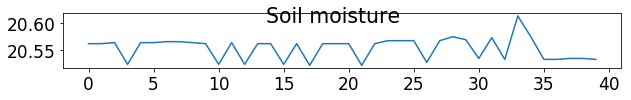

In [67]:
plt.figure(figsize=(10,1))
plt.plot(samples_test_v[100020, :, 0])
plt.suptitle('Soil moisture')

Text(0.5, 0.98, 'Temperature')

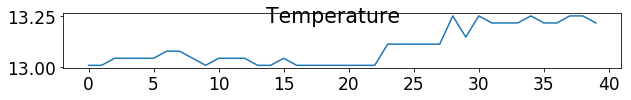

In [68]:
plt.figure(figsize=(10,1))
plt.plot(samples_test_v[100020, :, 1])
plt.suptitle('Temperature')

Text(0.5, 0.98, 'Battery charge')

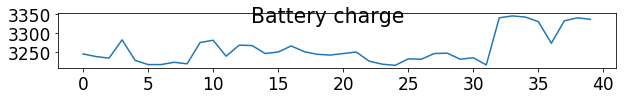

In [69]:
plt.figure(figsize=(10,1))
plt.plot(samples_test_v[100020, :, 2])
plt.suptitle('Battery charge')

Text(0.5, 0.98, 'Soil moisture')

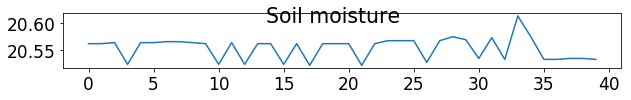

In [66]:
plt.figure(figsize=(10,1))
plt.plot(samples_test_v[100020, :, 0])
plt.suptitle('Soil moisture')

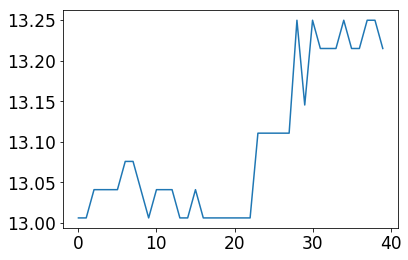

In [62]:
plt.figure(figsize=(10,1))
plt.plot(samples_test_v[100020, :, 1])

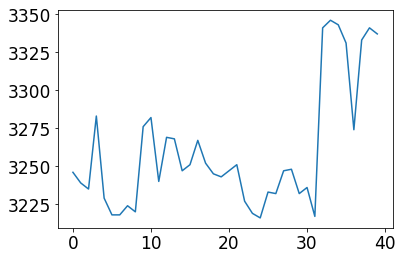

In [63]:
plt.figure(figsize=(10,1))
plt.plot(samples_test_v[100020, :, 2])

In [14]:
auto_train=auto_train[~cont_nan_train]
auto_test=auto_test[~cont_nan_test]

In [15]:
%%time
k=12
trans = umap.UMAP(n_neighbors=k, # number of neighbours for manifold approximation
                  min_dist=0.2, # minimum distance of points
                  n_components=2, # dimension of low dimensional representation
                  metric='euclidean', # metric for distance between points in high dimensional space
                  random_state=1234,
                  verbose=1
                 ).fit(samples_train_v.reshape(len(samples_train_v), 120)) # the actual data we use for approximation

embedding2d = trans.transform(samples_train_v.reshape(len(samples_train_v), 120))
xs2 = embedding2d[:,0]
ys2 = embedding2d[:,1]

UMAP(min_dist=0.2, n_neighbors=12, random_state=1234, verbose=1)
Construct fuzzy simplicial set
Fri Nov  6 13:02:59 2020 Finding Nearest Neighbors
Fri Nov  6 13:02:59 2020 Building RP forest with 25 trees
Fri Nov  6 13:03:09 2020 NN descent for 17 iterations
	 0  /  17
	 1  /  17
	 2  /  17
	 3  /  17
	 4  /  17
Fri Nov  6 13:03:28 2020 Finished Nearest Neighbor Search
Fri Nov  6 13:03:33 2020 Construct embedding


/home/polz-j/miniconda3/envs/umap_visualization/lib/python3.6/site-packages/sklearn/manifold/_spectral_embedding.py:236: UserWarning: Graph is not fully connected, spectral embedding may not work as expected.
  warnings.warn("Graph is not fully connected, spectral embedding"


	completed  0  /  200 epochs
	completed  20  /  200 epochs
	completed  40  /  200 epochs
	completed  60  /  200 epochs
	completed  80  /  200 epochs
	completed  100  /  200 epochs
	completed  120  /  200 epochs
	completed  140  /  200 epochs
	completed  160  /  200 epochs
	completed  180  /  200 epochs
Fri Nov  6 13:12:16 2020 Finished embedding
CPU times: user 52min 13s, sys: 10min 55s, total: 1h 3min 8s
Wall time: 9min 16s


# k-means clustering

In [16]:
n_clusters = 1000

In [17]:
kmeans = KMeans(n_clusters=n_clusters, random_state=1234).fit(embedding2d)

In [18]:
kmeans_l = kmeans.labels_

In [19]:
y_train = (ref_train+auto_train)>0

<img src='data:image/png;base64,iVBORw0KGgoAAAANSUhEUgAAAEAAAABACAYAAACqaXHeAAAABHNCSVQICAgIfAhkiAAAAAlwSFlz
AAAB+wAAAfsBxc2miwAAABl0RVh0U29mdHdhcmUAd3d3Lmlua3NjYXBlLm9yZ5vuPBoAAA6zSURB
VHic7ZtpeFRVmsf/5966taWqUlUJ2UioBBJiIBAwCZtog9IOgjqACsogKtqirT2ttt069nQ/zDzt
tI4+CrJIREFaFgWhBXpUNhHZQoKBkIUASchWla1S+3ar7r1nPkDaCAnZKoQP/D7mnPOe9/xy76n3
nFSAW9ziFoPFNED2LLK5wcyBDObkb8ZkxuaoSYlI6ZcOKq1eWFdedqNzGHQBk9RMEwFAASkk0Xw3
ETacDNi2vtvc7L0ROdw0AjoSotQVkKSvHQz/wRO1lScGModBFbDMaNRN1A4tUBCS3lk7BWhQkgpD
lG4852/+7DWr1R3uHAZVQDsbh6ZPN7CyxUrCzJMRouusj0ipRwD2uKm0Zn5d2dFwzX1TCGhnmdGo
G62Nna+isiUqhkzuKrkQaJlPEv5mFl2fvGg2t/VnzkEV8F5ioioOEWkLG86fvbpthynjdhXYZziQ
x1hC9J2NFyi8vCTt91Fh04KGip0AaG9zuCk2wQCVyoNU3Hjezee9bq92duzzTmxsRJoy+jEZZZYo
GTKJ6SJngdJqAfRzpze0+jHreUtPc7gpBLQnIYK6BYp/uGhw9YK688eu7v95ysgshcg9qSLMo3JC
4jqLKQFBgdKDPoQ+Pltb8dUyQLpeDjeVgI6EgLIQFT5tEl3rn2losHVsexbZ3EyT9wE1uGdkIPcy
BGxn8QUq1QrA5nqW5i2tLqvrrM9NK6AdkVIvL9E9bZL/oyfMVd/jqvc8LylzRBKDJSzIExwhQzuL
QYGQj4rHfFTc8mUdu3E7yoLtbTe9gI4EqVgVkug2i5+uXGo919ixbRog+3fTbQ8qJe4ZOYNfMoTI
OoshUNosgO60AisX15aeI2PSIp5KiFLI9ubb1vV3Qb2ltwLakUCDAkWX7/nHKRmmGIl9VgYsUhJm
2NXjKYADtM1ygne9QQDIXlk49FBstMKx66D1v4+XuQr7vqTe0VcBHQlRWiOCbmmSYe2SqtL6q5rJ
zsTb7lKx3FKOYC4DoqyS/B5bvLPxvD9Qtf6saxYLQGJErmDOdOMr/zo96km1nElr8bmPOBwI9COv
HnFPRIwmkSOv9kcAS4heRsidOkpeWBgZM+UBrTFAXNYL5Vf2ii9c1trNzpYdaoVil3WIc+wdk+gQ
noie3ecCcxt9ITcLAPWt/laGEO/9U6PmzZkenTtsSMQ8uYywJVW+grCstAvCIaAdArAsIWkRDDs/
KzLm2YcjY1Lv0UdW73HabE9n6V66cxSzfEmuJssTpKGVp+0vHq73FwL46eOjpMpbRAnNmJFrGJNu
Ukf9Yrz+3rghiumCKNXXWPhLYcjxGsIpoCMsIRoFITkW8AuyM8jC1+/QLx4bozCEJIq38+1rtpR6
V/yzb8eBlRb3fo5l783N0CWolAzJHaVNzkrTzlEp2bQ2q3TC5gn6wpnoQAmwSiGh2GitnTmVMc5O
UyfKWUKCIsU7+fZDKwqdT6DDpvkzAX4/+AMFjk0tDp5GRXLpQ2MUmhgDp5gxQT8+Y7hyPsMi8uxF
71H0oebujHALECjFKaW9Lm68n18wXp2kVzIcABytD5iXFzg+WVXkegpAsOOYziqo0OkK76GyquC3
ltZAzMhhqlSNmmWTE5T6e3IN05ITFLM4GdN0vtZ3ob8Jh1NAKXFbm5PtLU/eqTSlGjkNAJjdgn/N
aedXa0tdi7+t9G0FIF49rtMSEgAs1kDLkTPO7ebm4IUWeyh1bKomXqlgMG6kJmHcSM0clYLJ8XtR
1GTnbV3F6I5wCGikAb402npp1h1s7LQUZZSMIfALFOuL3UUrfnS8+rez7v9qcold5tilgHbO1fjK
9ubb17u9oshxzMiUBKXWqJNxd+fqb0tLVs4lILFnK71H0Ind7uiPgACVcFJlrb0tV6DzxqqTIhUM
CwDf1/rrVhTa33/3pGPxJYdQ2l2cbgVcQSosdx8uqnDtbGjh9SlDVSMNWhlnilfqZk42Th2ZpLpf
xrHec5e815zrr0dfBZSwzkZfqsv+1FS1KUknUwPARVvItfKUY+cn57yP7qv07UE3p8B2uhUwLk09
e0SCOrK+hbdYHYLjRIl71wWzv9jpEoeOHhGRrJAzyEyNiJuUqX0g2sBN5kGK6y2Blp5M3lsB9Qh4
y2Ja6x6+i0ucmKgwMATwhSjdUu49tKrQ/pvN5d53ml2CGwCmJipmKjgmyuaXzNeL2a0AkQ01Th5j
2DktO3Jyk8f9vcOBQHV94OK+fPumJmvQHxJoWkaKWq9Vs+yUsbq0zGT1I4RgeH2b5wef7+c7bl8F
eKgoHVVZa8ZPEORzR6sT1BzDUAD/d9F78e2Tzv99v8D+fLVTqAKAsbGamKey1Mt9Ann4eH3gTXTz
idWtAJ8PQWOk7NzSeQn/OTHDuEikVF1R4z8BQCy+6D1aWRfY0tTGG2OM8rRoPaeIj5ZHzJxszElN
VM8K8JS5WOfv8mzRnQAKoEhmt8gyPM4lU9SmBK1MCQBnW4KONT86v1hZ1PbwSXPw4JWussVjtH9Y
NCoiL9UoH/6PSu8jFrfY2t36erQHXLIEakMi1SydmzB31h3GGXFDFNPaK8Rme9B79Ixrd0WN+1ij
NRQ/doRmuFLBkHSTOm5GruG+pFjFdAmorG4IXH1Qua6ASniclfFtDYt+oUjKipPrCQB7QBQ2lrgP
fFzm+9XWUtcqJ3/5vDLDpJ79XHZk3u8nGZ42qlj1+ydtbxysCezrydp6ugmipNJ7WBPB5tydY0jP
HaVNzs3QzeE4ZpTbI+ZbnSFPbVOw9vsfnVvqWnirPyCNGD08IlqtYkh2hjZ5dErEQzoNm+6ykyOt
Lt5/PQEuSRRKo22VkydK+vvS1XEKlhCJAnsqvcVvH7f/ZU2R67eXbMEGAMiIV5oWZWiWvz5Fv2xG
sjqNJQRvn3Rs2lji/lNP19VjAQDgD7FHhujZB9OGqYxRkZxixgRDVlqS6uEOFaJUVu0rPFzctrnF
JqijImVp8dEKVWyUXDk92zAuMZ6bFwpBU1HrOw6AdhQgUooChb0+ItMbWJitSo5Ws3IAOGEOtL53
0vHZih9sC4vtofZ7Qu6523V/fmGcds1TY3V36pUsBwAbSlxnVh2xLfAD/IAIMDf7XYIkNmXfpp2l
18rkAJAy9HKFaIr/qULkeQQKy9zf1JgDB2uaeFNGijo5QsUyacNUUTOnGO42xSnv4oOwpDi1zYkc
efUc3I5Gk6PhyTuVKaOGyLUAYPGIoY9Pu/atL/L92+4q9wbflRJ2Trpm/jPjdBtfnqB/dIThcl8A
KG7hbRuKnb8qsQsVvVlTrwQAQMUlf3kwJI24Z4JhPMtcfng5GcH49GsrxJpGvvHIaeem2ma+KSjQ
lIwUdYyCY8j4dE1KzijNnIP2llF2wcXNnsoapw9XxsgYAl6k+KzUXbi2yP3KR2ecf6z3BFsBICdW
nvnIaG3eHybqX7vbpEqUMT+9OL4Qpe8VON7dXuFd39v19FoAABRVePbGGuXTszO0P7tu6lghUonE
llRdrhArLvmKdh9u29jcFiRRkfLUxBiFNiqSU9icoZQHo5mYBI1MBgBH6wMNb+U7Pnw337H4gi1Y
ciWs+uks3Z9fztUvfzxTm9Ne8XXkvQLHNytOOZeiD4e0PgkAIAYCYknKUNUDSXEKzdWNpnil7r4p
xqkjTarZMtk/K8TQ6Qve78qqvXurGwIJqcOUKfUWHsm8KGvxSP68YudXq4pcj39X49uOK2X142O0
Tz5/u/7TVybqH0rSya6ZBwD21/gubbrgWdDgEOx9W
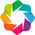

:Layout
   .Bivariate.I   :Bivariate   [x,y]   (Density)
   .Bivariate.II  :Bivariate   [x,y]   (Density)
   .Bivariate.III :Bivariate   [x,y]   (Density)

In [43]:
width = 400
height = 400

hv.extension('bokeh', 'matplotlib')
hex_two_distributions1 = hv.HexTiles((xs2[np.logical_and(ref_train==0, auto_train==0)], ys2[np.logical_and(ref_train==0, auto_train==0)]))
hex_two_distributions2 = hv.HexTiles((xs2[ref_train==1], ys2[ref_train==1]))
hex_two_distributions3 = hv.HexTiles((xs2[auto_train==1], ys2[auto_train==1]))
# scatter2d = hv.Scatter((xs2, ys2))
overlay = hv.Bivariate(hex_two_distributions1) + hv.Bivariate(hex_two_distributions2) + hv.Bivariate(hex_two_distributions3)

overlay.opts(
    opts.Bivariate(width=width, height=height, levels=100, show_legend=False, line_width=1))

Text(0.5, 1.05, '???')

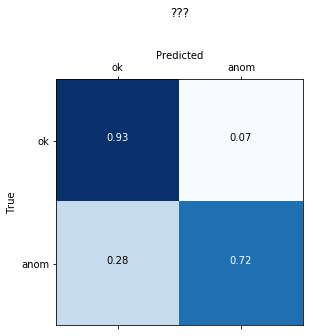

In [23]:
pred_train = np.zeros_like(ref_train)
k_means_predictor = np.zeros(n_clusters)
for k in range(n_clusters):
    subs = y_train[kmeans_l==k]
    if np.round(np.sum(subs)/len(subs)*100, decimals=1)>30:
        k_means_predictor[k] = 1
        pred_train[kmeans_l==k] = 1

labels = ['ok', 'anom']

fig = plt.figure(figsize=(15,5))
ax1 = fig.add_subplot(131)
cnf_matrix = confusion_matrix(y_train, pred_train)
cm = cnf_matrix.astype('float') / cnf_matrix.sum(axis=1)[:, np.newaxis]
cax = ax1.matshow(cm, cmap=plt.cm.Blues)
ax1.set_xticklabels([''] + labels)
ax1.set_yticklabels([''] + labels)
fmt = '.2f'
thresh = cm.max() / 2.
for i, j in itertools.product(range(cm.shape[0]), range(cm.shape[1])):
    plt.text(j, i, format(cm[i, j], fmt),
             horizontalalignment="center",
             color="white" if cm[i, j] > thresh else "black")
plt.xlabel('Predicted')
plt.ylabel('True')
ax1.xaxis.set_label_position('top')
plt.title('???', pad=50)

In [24]:
k_means_predictor

array([1., 1., 0., 0., 1., 0., 1., 0., 1., 0., 1., 0., 0., 1., 0., 0., 0.,
       0., 0., 1., 1., 1., 0., 0., 1., 1., 1., 0., 0., 1., 0., 0., 0., 0.,
       1., 0., 0., 0., 1., 0., 1., 0., 1., 0., 0., 0., 1., 1., 0., 0., 1.,
       0., 1., 0., 0., 0., 1., 0., 0., 1., 0., 0., 0., 0., 1., 1., 0., 1.,
       1., 1., 1., 0., 0., 0., 0., 1., 1., 0., 0., 0., 0., 0., 1., 0., 0.,
       1., 0., 1., 0., 1., 0., 0., 0., 0., 1., 0., 0., 0., 0., 0., 1., 0.,
       1., 0., 1., 0., 1., 0., 0., 1., 1., 1., 1., 0., 0., 1., 0., 0., 1.,
       0., 0., 1., 1., 1., 1., 1., 0., 1., 0., 0., 1., 1., 0., 0., 0., 0.,
       1., 0., 0., 0., 0., 0., 0., 0., 0., 1., 0., 1., 0., 0., 0., 0., 1.,
       0., 0., 0., 1., 1., 0., 1., 1., 0., 1., 0., 1., 0., 1., 0., 0., 0.,
       1., 1., 0., 0., 0., 1., 0., 1., 1., 0., 0., 0., 0., 1., 0., 1., 0.,
       1., 1., 1., 0., 0., 0., 0., 1., 1., 0., 0., 1., 0., 0., 1., 0., 0.,
       0., 1., 0., 0., 0., 0., 0., 0., 1., 1., 0., 0., 1., 0., 1., 1., 0.,
       0., 1., 1., 0., 1.

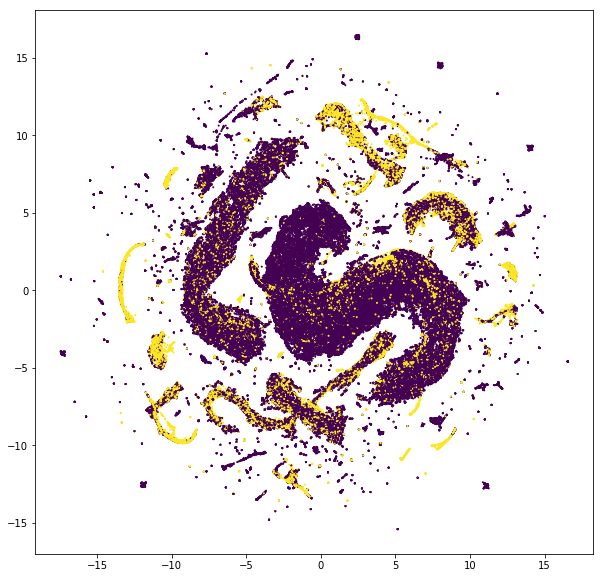

In [25]:
plt.figure(figsize=(10,10))
plt.scatter(xs2, ys2, c=ref_train, s=1)

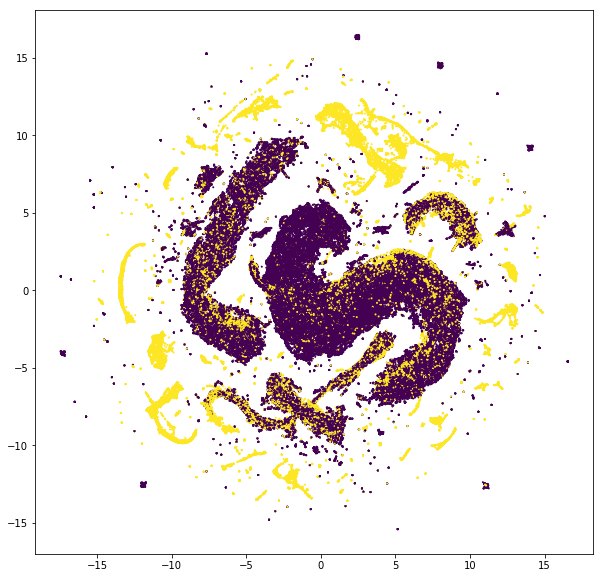

In [26]:
plt.figure(figsize=(10,10))
plt.scatter(xs2, ys2, c=ref_train+auto_train, s=1)

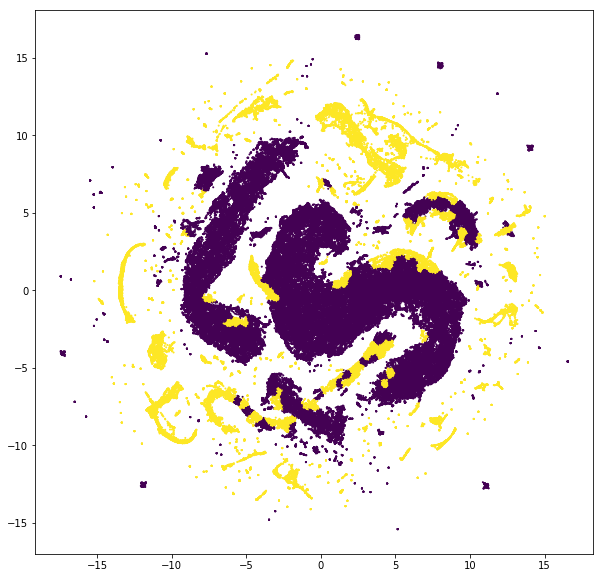

In [27]:
plt.figure(figsize=(10,10))
plt.scatter(xs2, ys2, c=pred_train, s=1)

# Test

In [30]:
y_test = (ref_test+auto_test)>0

In [31]:
embedding2d_test = trans.transform(samples_test_v.reshape(len(samples_test_v), 120))

	completed  0  /  30 epochs
	completed  3  /  30 epochs
	completed  6  /  30 epochs
	completed  9  /  30 epochs
	completed  12  /  30 epochs
	completed  15  /  30 epochs
	completed  18  /  30 epochs
	completed  21  /  30 epochs
	completed  24  /  30 epochs
	completed  27  /  30 epochs


In [32]:
kmeans_test = kmeans.predict(embedding2d_test)

In [37]:
def Roc_curve(y_train, y_test, kmeans_train, kmeans_test, tr_start, tr_end):
    roc_train = []
    roc_test = []

    for i in tqdm.tqdm(range(tr_start,1+tr_end,1)):
        t = i
        
        
        y_predicted = np.zeros_like(y_train)
        k_means_predictor = np.zeros(n_clusters)
        for k in range(n_clusters):
            subs = y_train[kmeans_train==k]
            if np.round(np.sum(subs)/len(subs)*100, decimals=1)>t:
                k_means_predictor[k] = 1
                y_predicted[kmeans_train==k] = 1
        
        true_pos = np.sum(np.logical_and(y_train==1, y_predicted==1))
        true_neg = np.sum(np.logical_and(y_train==0, y_predicted==0))
        false_pos = np.sum(np.logical_and(y_train==0, y_predicted==1))
        false_neg = np.sum(np.logical_and(y_train==1, y_predicted==0))
        cond_neg = true_neg+false_pos
        cond_pos = true_pos+false_neg
        roc_train.append([true_pos/cond_pos, false_pos/cond_neg])
        
        y_predicted_test = np.zeros_like(y_test)

        for k in range(n_clusters):
            if k_means_predictor[k]==1:
                y_predicted_test[kmeans_test==k] = 1
        
        true_pos = np.sum(np.logical_and(y_test==1, y_predicted_test==1))
        true_neg = np.sum(np.logical_and(y_test==0, y_predicted_test==0))
        false_pos = np.sum(np.logical_and(y_test==0, y_predicted_test==1))
        false_neg = np.sum(np.logical_and(y_test==1, y_predicted_test==0))
        cond_neg = true_neg+false_pos
        cond_pos = true_pos+false_neg
        roc_test.append([true_pos/cond_pos, false_pos/cond_neg])
    roc_train.append([0,0])
    roc_test.append([0,0])
    
    return np.array(roc_train), np.array(roc_test)

In [38]:
roc_train, roc_test = Roc_curve(y_train, y_test, kmeans_l, kmeans_test, 0, 100)

100%|██████████| 101/101 [00:10<00:00,  9.85it/s]


In [47]:
roc_train[50]

array([0.63635407, 0.01805472])

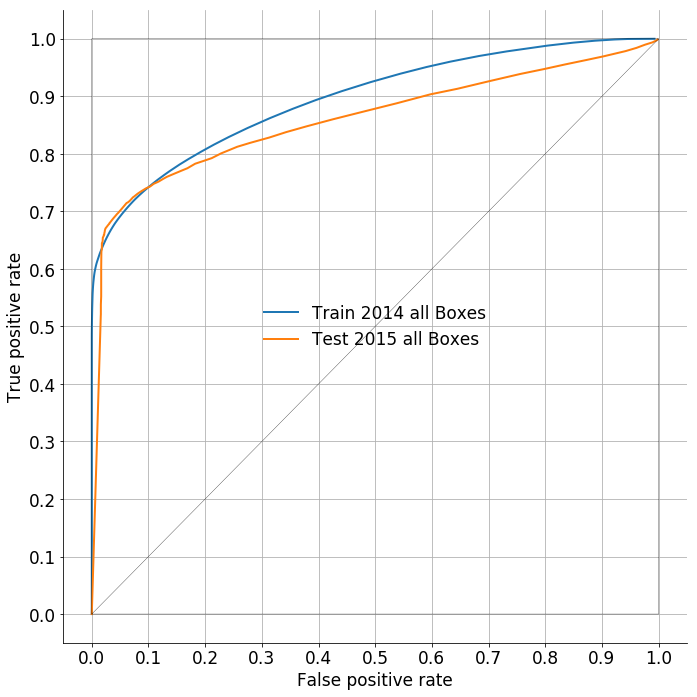

In [52]:
fig, ax = plt.subplots(1,1,figsize=(10,10))

plt.plot(roc_train[:,1],roc_train[:,0], label='Train 2014 all Boxes', lw=2)
plt.plot(roc_test[:,1],roc_test[:,0], label='Test 2015 all Boxes', lw=2)
plt.plot([0,0,1,0,1,1],[0,1,1,0,0,1], 'k-', linewidth=0.3)

plt.xlabel('False positive rate')
plt.ylabel('True positive rate')
# plt.title('ROC curve 2018-04')
plt.grid()
plt.yticks(np.arange(0, 1.01, 0.1))
plt.xticks(np.arange(0, 1.01, 0.1))
# plt.xlim(0, 0.66, 0.1)
# plt.ylim(0.35, 1.01, 0.1)
ax.spines['right'].set_visible(False)
ax.spines['top'].set_visible(False)
plt.legend(frameon=False, loc='center')
plt.tight_layout()
plt.show()

Text(0.5, 1.05, '???')

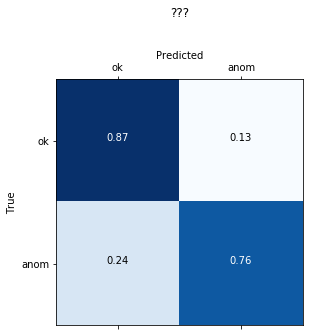

In [32]:
pred = np.zeros_like(y_test)

for k in range(n_clusters):
    if k_means_predictor[k]==1:
        pred[kmeans_test==k] = 1

labels = ['ok', 'anom']

fig = plt.figure(figsize=(15,5))
ax1 = fig.add_subplot(131)
cnf_matrix = confusion_matrix(y_test, pred)
cm = cnf_matrix.astype('float') / cnf_matrix.sum(axis=1)[:, np.newaxis]
cax = ax1.matshow(cm, cmap=plt.cm.Blues)
ax1.set_xticklabels([''] + labels)
ax1.set_yticklabels([''] + labels)
fmt = '.2f'
thresh = cm.max() / 2.
for i, j in itertools.product(range(cm.shape[0]), range(cm.shape[1])):
    plt.text(j, i, format(cm[i, j], fmt),
             horizontalalignment="center",
             color="white" if cm[i, j] > thresh else "black")
plt.xlabel('Predicted')
plt.ylabel('True')
ax1.xaxis.set_label_position('top')
plt.title('???', pad=50)

In [33]:
xs2_test = embedding2d_test[:,0]
ys2_test = embedding2d_test[:,1]

<img src='data:image/png;base64,iVBORw0KGgoAAAANSUhEUgAAAEAAAABACAYAAACqaXHeAAAABHNCSVQICAgIfAhkiAAAAAlwSFlz
AAAB+wAAAfsBxc2miwAAABl0RVh0U29mdHdhcmUAd3d3Lmlua3NjYXBlLm9yZ5vuPBoAAA6zSURB
VHic7ZtpeFRVmsf/5966taWqUlUJ2UioBBJiIBAwCZtog9IOgjqACsogKtqirT2ttt069nQ/zDzt
tI4+CrJIREFaFgWhBXpUNhHZQoKBkIUASchWla1S+3ar7r1nPkDaCAnZKoQP/D7mnPOe9/xy76n3
nFSAW9ziFoPFNED2LLK5wcyBDObkb8ZkxuaoSYlI6ZcOKq1eWFdedqNzGHQBk9RMEwFAASkk0Xw3
ETacDNi2vtvc7L0ROdw0AjoSotQVkKSvHQz/wRO1lScGModBFbDMaNRN1A4tUBCS3lk7BWhQkgpD
lG4852/+7DWr1R3uHAZVQDsbh6ZPN7CyxUrCzJMRouusj0ipRwD2uKm0Zn5d2dFwzX1TCGhnmdGo
G62Nna+isiUqhkzuKrkQaJlPEv5mFl2fvGg2t/VnzkEV8F5ioioOEWkLG86fvbpthynjdhXYZziQ
x1hC9J2NFyi8vCTt91Fh04KGip0AaG9zuCk2wQCVyoNU3Hjezee9bq92duzzTmxsRJoy+jEZZZYo
GTKJ6SJngdJqAfRzpze0+jHreUtPc7gpBLQnIYK6BYp/uGhw9YK688eu7v95ysgshcg9qSLMo3JC
4jqLKQFBgdKDPoQ+Pltb8dUyQLpeDjeVgI6EgLIQFT5tEl3rn2losHVsexbZ3EyT9wE1uGdkIPcy
BGxn8QUq1QrA5nqW5i2tLqvrrM9NK6AdkVIvL9E9bZL/oyfMVd/jqvc8LylzRBKDJSzIExwhQzuL
QYGQj4rHfFTc8mUdu3E7yoLtbTe9gI4EqVgVkug2i5+uXGo919ixbRog+3fTbQ8qJe4ZOYNfMoTI
OoshUNosgO60AisX15aeI2PSIp5KiFLI9ubb1vV3Qb2ltwLakUCDAkWX7/nHKRmmGIl9VgYsUhJm
2NXjKYADtM1ygne9QQDIXlk49FBstMKx66D1v4+XuQr7vqTe0VcBHQlRWiOCbmmSYe2SqtL6q5rJ
zsTb7lKx3FKOYC4DoqyS/B5bvLPxvD9Qtf6saxYLQGJErmDOdOMr/zo96km1nElr8bmPOBwI9COv
HnFPRIwmkSOv9kcAS4heRsidOkpeWBgZM+UBrTFAXNYL5Vf2ii9c1trNzpYdaoVil3WIc+wdk+gQ
noie3ecCcxt9ITcLAPWt/laGEO/9U6PmzZkenTtsSMQ8uYywJVW+grCstAvCIaAdArAsIWkRDDs/
KzLm2YcjY1Lv0UdW73HabE9n6V66cxSzfEmuJssTpKGVp+0vHq73FwL46eOjpMpbRAnNmJFrGJNu
Ukf9Yrz+3rghiumCKNXXWPhLYcjxGsIpoCMsIRoFITkW8AuyM8jC1+/QLx4bozCEJIq38+1rtpR6
V/yzb8eBlRb3fo5l783N0CWolAzJHaVNzkrTzlEp2bQ2q3TC5gn6wpnoQAmwSiGh2GitnTmVMc5O
UyfKWUKCIsU7+fZDKwqdT6DDpvkzAX4/+AMFjk0tDp5GRXLpQ2MUmhgDp5gxQT8+Y7hyPsMi8uxF
71H0oebujHALECjFKaW9Lm68n18wXp2kVzIcABytD5iXFzg+WVXkegpAsOOYziqo0OkK76GyquC3
ltZAzMhhqlSNmmWTE5T6e3IN05ITFLM4GdN0vtZ3ob8Jh1NAKXFbm5PtLU/eqTSlGjkNAJjdgn/N
aedXa0tdi7+t9G0FIF49rtMSEgAs1kDLkTPO7ebm4IUWeyh1bKomXqlgMG6kJmHcSM0clYLJ8XtR
1GTnbV3F6I5wCGikAb402npp1h1s7LQUZZSMIfALFOuL3UUrfnS8+rez7v9qcold5tilgHbO1fjK
9ubb17u9oshxzMiUBKXWqJNxd+fqb0tLVs4lILFnK71H0Ind7uiPgACVcFJlrb0tV6DzxqqTIhUM
CwDf1/rrVhTa33/3pGPxJYdQ2l2cbgVcQSosdx8uqnDtbGjh9SlDVSMNWhlnilfqZk42Th2ZpLpf
xrHec5e815zrr0dfBZSwzkZfqsv+1FS1KUknUwPARVvItfKUY+cn57yP7qv07UE3p8B2uhUwLk09
e0SCOrK+hbdYHYLjRIl71wWzv9jpEoeOHhGRrJAzyEyNiJuUqX0g2sBN5kGK6y2Blp5M3lsB9Qh4
y2Ja6x6+i0ucmKgwMATwhSjdUu49tKrQ/pvN5d53ml2CGwCmJipmKjgmyuaXzNeL2a0AkQ01Th5j
2DktO3Jyk8f9vcOBQHV94OK+fPumJmvQHxJoWkaKWq9Vs+yUsbq0zGT1I4RgeH2b5wef7+c7bl8F
eKgoHVVZa8ZPEORzR6sT1BzDUAD/d9F78e2Tzv99v8D+fLVTqAKAsbGamKey1Mt9Ann4eH3gTXTz
idWtAJ8PQWOk7NzSeQn/OTHDuEikVF1R4z8BQCy+6D1aWRfY0tTGG2OM8rRoPaeIj5ZHzJxszElN
VM8K8JS5WOfv8mzRnQAKoEhmt8gyPM4lU9SmBK1MCQBnW4KONT86v1hZ1PbwSXPw4JWussVjtH9Y
NCoiL9UoH/6PSu8jFrfY2t36erQHXLIEakMi1SydmzB31h3GGXFDFNPaK8Rme9B79Ixrd0WN+1ij
NRQ/doRmuFLBkHSTOm5GruG+pFjFdAmorG4IXH1Qua6ASniclfFtDYt+oUjKipPrCQB7QBQ2lrgP
fFzm+9XWUtcqJ3/5vDLDpJ79XHZk3u8nGZ42qlj1+ydtbxysCezrydp6ugmipNJ7WBPB5tydY0jP
HaVNzs3QzeE4ZpTbI+ZbnSFPbVOw9vsfnVvqWnirPyCNGD08IlqtYkh2hjZ5dErEQzoNm+6ykyOt
Lt5/PQEuSRRKo22VkydK+vvS1XEKlhCJAnsqvcVvH7f/ZU2R67eXbMEGAMiIV5oWZWiWvz5Fv2xG
sjqNJQRvn3Rs2lji/lNP19VjAQDgD7FHhujZB9OGqYxRkZxixgRDVlqS6uEOFaJUVu0rPFzctrnF
JqijImVp8dEKVWyUXDk92zAuMZ6bFwpBU1HrOw6AdhQgUooChb0+ItMbWJitSo5Ws3IAOGEOtL53
0vHZih9sC4vtofZ7Qu6523V/fmGcds1TY3V36pUsBwAbSlxnVh2xLfAD/IAIMDf7XYIkNmXfpp2l
18rkAJAy9HKFaIr/qULkeQQKy9zf1JgDB2uaeFNGijo5QsUyacNUUTOnGO42xSnv4oOwpDi1zYkc
efUc3I5Gk6PhyTuVKaOGyLUAYPGIoY9Pu/atL/L92+4q9wbflRJ2Trpm/jPjdBtfnqB/dIThcl8A
KG7hbRuKnb8qsQsVvVlTrwQAQMUlf3kwJI24Z4JhPMtcfng5GcH49GsrxJpGvvHIaeem2ma+KSjQ
lIwUdYyCY8j4dE1KzijNnIP2llF2wcXNnsoapw9XxsgYAl6k+KzUXbi2yP3KR2ecf6z3BFsBICdW
nvnIaG3eHybqX7vbpEqUMT+9OL4Qpe8VON7dXuFd39v19FoAABRVePbGGuXTszO0P7tu6lghUonE
llRdrhArLvmKdh9u29jcFiRRkfLUxBiFNiqSU9icoZQHo5mYBI1MBgBH6wMNb+U7Pnw337H4gi1Y
ciWs+uks3Z9fztUvfzxTm9Ne8XXkvQLHNytOOZeiD4e0PgkAIAYCYknKUNUDSXEKzdWNpnil7r4p
xqkjTarZMtk/K8TQ6Qve78qqvXurGwIJqcOUKfUWHsm8KGvxSP68YudXq4pcj39X49uOK2X142O0
Tz5/u/7TVybqH0rSya6ZBwD21/gubbrgWdDgEOx9W
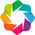

:Layout
   .Bivariate.I  :Bivariate   [x,y]   (Density)
   .Bivariate.II :Bivariate   [x,y]   (Density)

In [34]:
width = 400
height = 400
hv.extension('bokeh', 'matplotlib')
hex_two_distributions1 = hv.HexTiles((xs2_test[y_test==0], ys2_test[y_test==0]))
hex_two_distributions2 = hv.HexTiles((xs2_test[y_test==1], ys2_test[y_test==1]))
# scatter2d = hv.Scatter((xs2, ys2))
overlay = hv.Bivariate(hex_two_distributions1) + hv.Bivariate(hex_two_distributions2)

overlay.opts(
    opts.Bivariate(width=width, height=height, levels=100, show_legend=False, line_width=1))

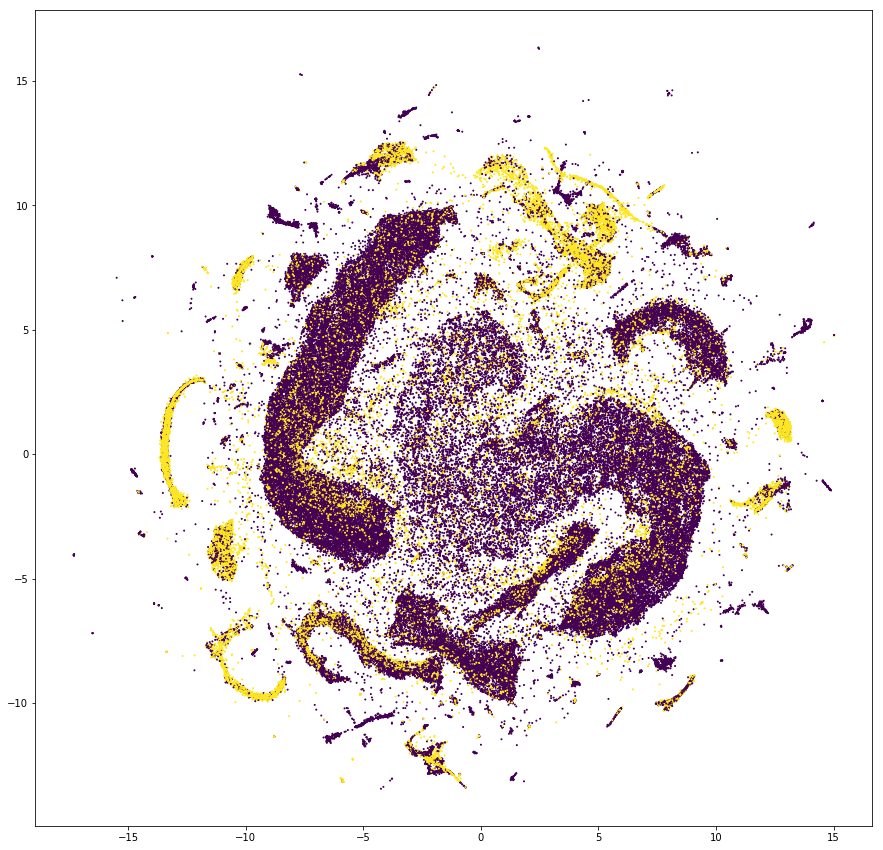

In [35]:
plt.figure(figsize=(15,15))
plt.scatter(xs2_test, ys2_test, c=ref_test, s=1)

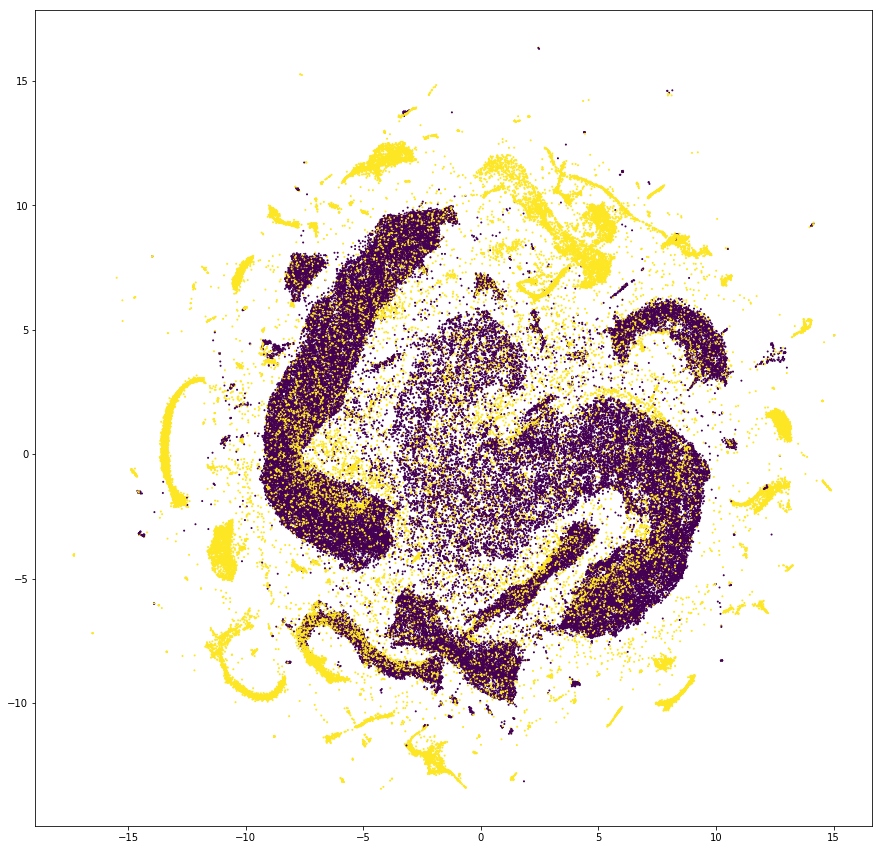

In [36]:
plt.figure(figsize=(15,15))
plt.scatter(xs2_test, ys2_test, c=y_test, s=1)

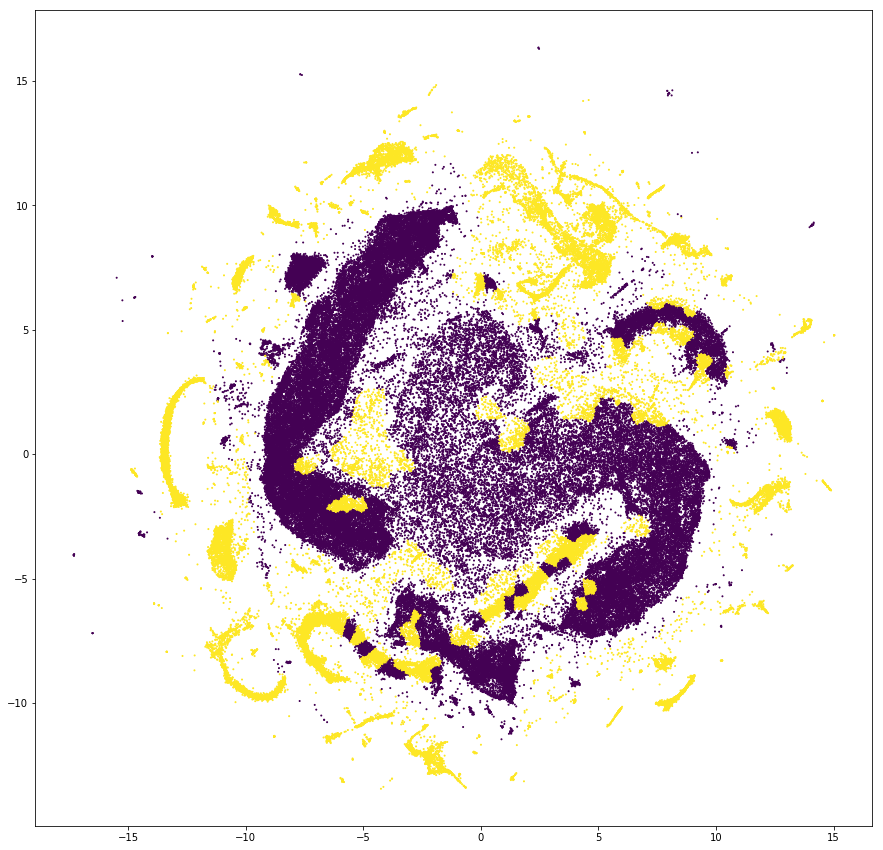

In [37]:
plt.figure(figsize=(15,15))
plt.scatter(xs2_test, ys2_test, c=pred, s=1)